In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels.cache
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P04567.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P08677.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P03976.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P02969.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P05013.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P00050.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P05845.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P07441.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P00262.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P06719.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels/P05114.txt
/kaggle/input/fulltriplethreat/FullDCSMP/chi

In [2]:
%pip install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 682.2 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 723.3/723.3 kB 5.3 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

In [4]:
import os
from pathlib import Path

import numpy as np
import torch

import shutil
import random

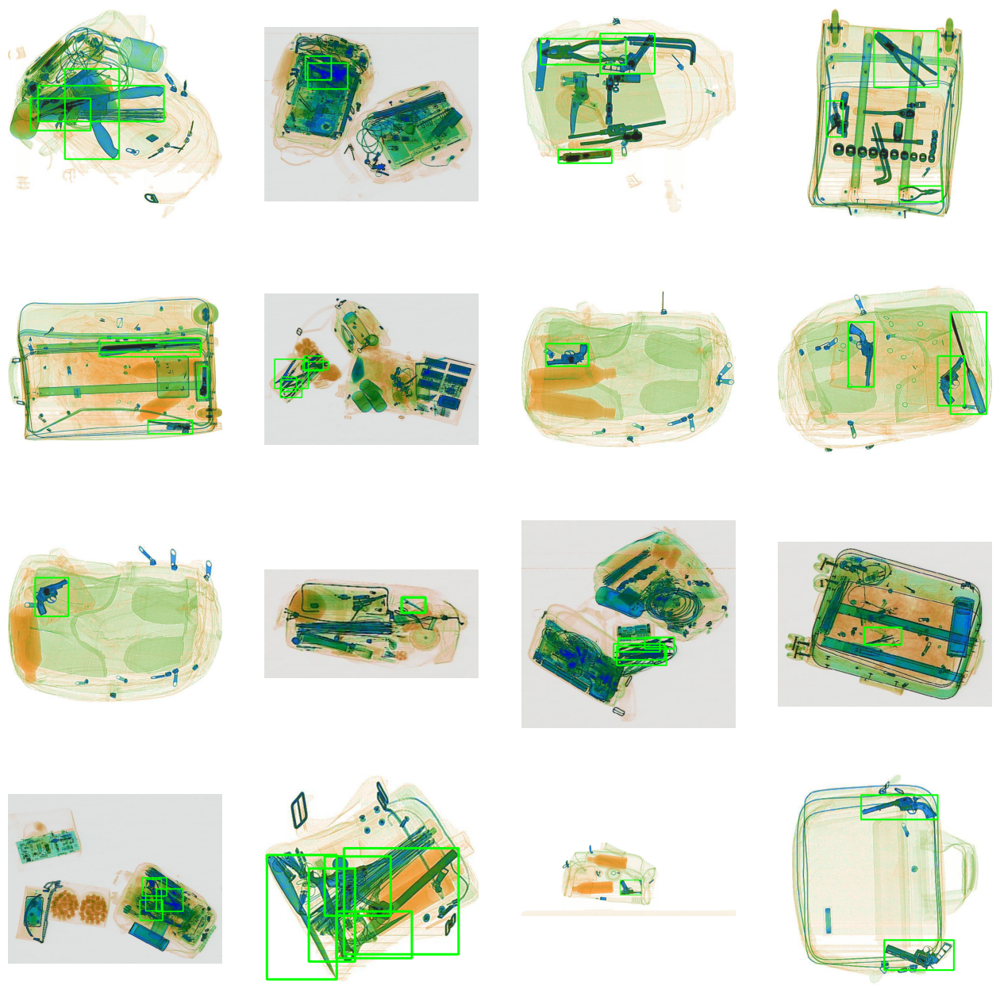

In [5]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train/images"
train_labels = "/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train/labels"

#test_images = "test\images"
#test_labels = "test\labels"

val_images = "/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/images"
val_labels = "/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()


**YOLOv8**

In [6]:
# Loading a pretrained model
model = YOLO('yolov8m.pt')

# Training the model
model.train(data = '/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml',
            epochs = 50,
            imgsz = 640,
            seed = 42,
            batch = 8,
            workers = 4)

100%|██████████| 49.7M/49.7M [00:00<00:00, 230MB/s] 


Ultralytics YOLOv8.1.38 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

100%|██████████| 755k/755k [00:00<00:00, 14.1MB/s]
2024-03-31 04:58:36,569	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-03-31 04:58:37,823	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-03-31 04:58:42.014787: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-31 04:58:42.014886: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-31 04:58:42.286042: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 72.5MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train/labels... 5680 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5680/5680 [00:37<00:00, 151.15it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels... 1442 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1442/1442 [00:09<00:00, 148.18it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.08G      1.325      2.085      1.475         23        640: 100%|██████████| 710/710 [03:07<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:21<00:00,  4.25it/s]

                   all       1442       3344      0.477      0.453      0.455      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.06G      1.419      1.764      1.561         32        640: 100%|██████████| 710/710 [03:01<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.37it/s]


                   all       1442       3344       0.56      0.466        0.5      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.06G      1.376      1.662      1.545         39        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.33it/s]


                   all       1442       3344      0.587       0.56      0.591       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.95G       1.33      1.559       1.51         43        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]

                   all       1442       3344      0.694      0.568      0.628      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.95G       1.25      1.433      1.457         37        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]


                   all       1442       3344      0.685      0.576      0.649      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.95G        1.2      1.332      1.413         39        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.33it/s]


                   all       1442       3344      0.778      0.623      0.719      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.95G      1.156      1.254      1.386         30        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.35it/s]

                   all       1442       3344      0.759      0.657      0.744      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.94G      1.109      1.175      1.351         23        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.35it/s]

                   all       1442       3344      0.802      0.651      0.744      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.94G      1.085      1.134      1.331         34        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.33it/s]


                   all       1442       3344      0.818      0.676      0.766      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.95G      1.045       1.07      1.306         29        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.30it/s]

                   all       1442       3344      0.807      0.716      0.794      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.93G      1.014       1.03      1.285         36        640: 100%|██████████| 710/710 [02:59<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.36it/s]


                   all       1442       3344      0.784      0.713      0.787      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.94G     0.9986      1.031      1.278         28        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.31it/s]

                   all       1442       3344      0.858       0.71      0.813      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.96G     0.9707     0.9673       1.26         35        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.38it/s]


                   all       1442       3344      0.836      0.733      0.818      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.94G      0.957     0.9495      1.252         40        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.38it/s]

                   all       1442       3344       0.85      0.757      0.835      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.95G     0.9345     0.9229      1.228         23        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]


                   all       1442       3344      0.848      0.759      0.838      0.639

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.95G     0.9192     0.8902      1.215         35        640: 100%|██████████| 710/710 [02:59<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.11it/s]

                   all       1442       3344      0.865      0.753      0.841      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.95G     0.8952     0.8584      1.198         31        640: 100%|██████████| 710/710 [03:00<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.18it/s]

                   all       1442       3344       0.86      0.759      0.845      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.95G     0.8851      0.843       1.19         25        640: 100%|██████████| 710/710 [02:59<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.26it/s]

                   all       1442       3344      0.854      0.788      0.857      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.96G     0.8801      0.826      1.189         33        640: 100%|██████████| 710/710 [02:59<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.27it/s]

                   all       1442       3344      0.862      0.767      0.857      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.95G     0.8642      0.811      1.178         30        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.29it/s]

                   all       1442       3344      0.887      0.765      0.857      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.95G     0.8472     0.7796      1.165         38        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.31it/s]


                   all       1442       3344      0.857      0.792      0.862      0.674

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.94G     0.8366     0.7667      1.156         26        640: 100%|██████████| 710/710 [02:59<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.28it/s]

                   all       1442       3344      0.894      0.765      0.869      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.96G     0.8269     0.7604      1.152         40        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.30it/s]

                   all       1442       3344      0.887        0.8      0.873      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.96G     0.8193     0.7484      1.147         38        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.28it/s]

                   all       1442       3344      0.884      0.796      0.874      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.95G     0.7982     0.7213      1.136         41        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.31it/s]


                   all       1442       3344      0.884      0.803      0.881      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.94G     0.7891     0.7133      1.128         43        640: 100%|██████████| 710/710 [02:59<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.39it/s]


                   all       1442       3344      0.903      0.793      0.881      0.707

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.95G     0.7796     0.6916      1.122         33        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.38it/s]

                   all       1442       3344      0.896      0.801      0.881      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.96G     0.7648     0.6722      1.109         29        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.36it/s]

                   all       1442       3344      0.917      0.805       0.89      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.96G     0.7623     0.6666      1.108         27        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]


                   all       1442       3344      0.903      0.807      0.888      0.717

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.96G     0.7566     0.6648      1.105         46        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.39it/s]

                   all       1442       3344       0.92      0.819      0.901       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.94G     0.7345     0.6418      1.089         34        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]

                   all       1442       3344      0.907      0.825      0.894      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.93G     0.7309     0.6273      1.092         28        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.39it/s]


                   all       1442       3344      0.907      0.821      0.897      0.729

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.95G     0.7269     0.6274      1.086         27        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.40it/s]


                   all       1442       3344      0.916      0.829        0.9      0.735

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.95G     0.7143     0.6116      1.081         36        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]

                   all       1442       3344       0.91      0.824        0.9      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.94G      0.707      0.602      1.068         38        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.38it/s]

                   all       1442       3344      0.904      0.838      0.903      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.93G      0.692     0.5845      1.062         33        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.35it/s]


                   all       1442       3344      0.926      0.829      0.907       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.94G     0.6916     0.5827      1.062         23        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.37it/s]


                   all       1442       3344      0.919      0.841      0.909      0.756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.94G     0.6726     0.5603       1.05         43        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.33it/s]


                   all       1442       3344      0.927      0.847      0.909      0.753

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.96G     0.6717     0.5593      1.051         22        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.41it/s]

                   all       1442       3344      0.931      0.849      0.913      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.95G     0.6621     0.5514      1.042         35        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.39it/s]


                   all       1442       3344      0.919      0.851      0.912       0.76
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.96G     0.5624     0.4023     0.9962         24        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.36it/s]

                   all       1442       3344      0.932      0.845      0.913      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.96G      0.554     0.3952     0.9897         16        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.37it/s]

                   all       1442       3344      0.933      0.855      0.916      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.94G     0.5429     0.3839     0.9793         24        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.34it/s]


                   all       1442       3344      0.931      0.864      0.919      0.769

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.95G     0.5341     0.3729     0.9757         16        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:17<00:00,  5.30it/s]


                   all       1442       3344      0.935      0.848      0.915      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.97G     0.5241      0.364     0.9678         10        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.37it/s]


                   all       1442       3344      0.943      0.849      0.916      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.95G     0.5112     0.3551     0.9622          9        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.37it/s]

                   all       1442       3344      0.943      0.853      0.918      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.95G     0.5028     0.3527     0.9528         20        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.36it/s]


                   all       1442       3344      0.935      0.862      0.921      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.94G     0.4924     0.3401     0.9455         11        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.36it/s]

                   all       1442       3344      0.928      0.867      0.918      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.96G     0.4835     0.3327     0.9451         19        640: 100%|██████████| 710/710 [02:58<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.38it/s]

                   all       1442       3344      0.935      0.863      0.919      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.96G     0.4735     0.3245     0.9375         25        640: 100%|██████████| 710/710 [02:58<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:16<00:00,  5.36it/s]


                   all       1442       3344      0.953      0.857      0.923      0.786

50 epochs completed in 2.770 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.38 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:18<00:00,  4.83it/s]


                   all       1442       3344      0.952      0.857      0.923      0.786
                   Gun       1442        872      0.986      0.978      0.994      0.949
                 Knife       1442        518      0.959      0.876      0.937      0.788
                Wrench       1442        620      0.927      0.813      0.895      0.751
                Pliers       1442       1099      0.957      0.831      0.923      0.757
              Scissors       1442        235       0.93      0.787      0.865      0.686
Speed: 0.2ms preprocess, 7.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇████████████████
metrics/mAP50-95(B),▁▁▂▃▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇███████████
metrics/precision(B),▁▂▃▄▅▅▆▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████████
metrics/recall(B),▁▁▃▃▄▄▄▅▅▅▆▆▆▆▇▆▇▆▇▇▇▇▇▇▇▇▇▇▇███████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ae79caf66b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

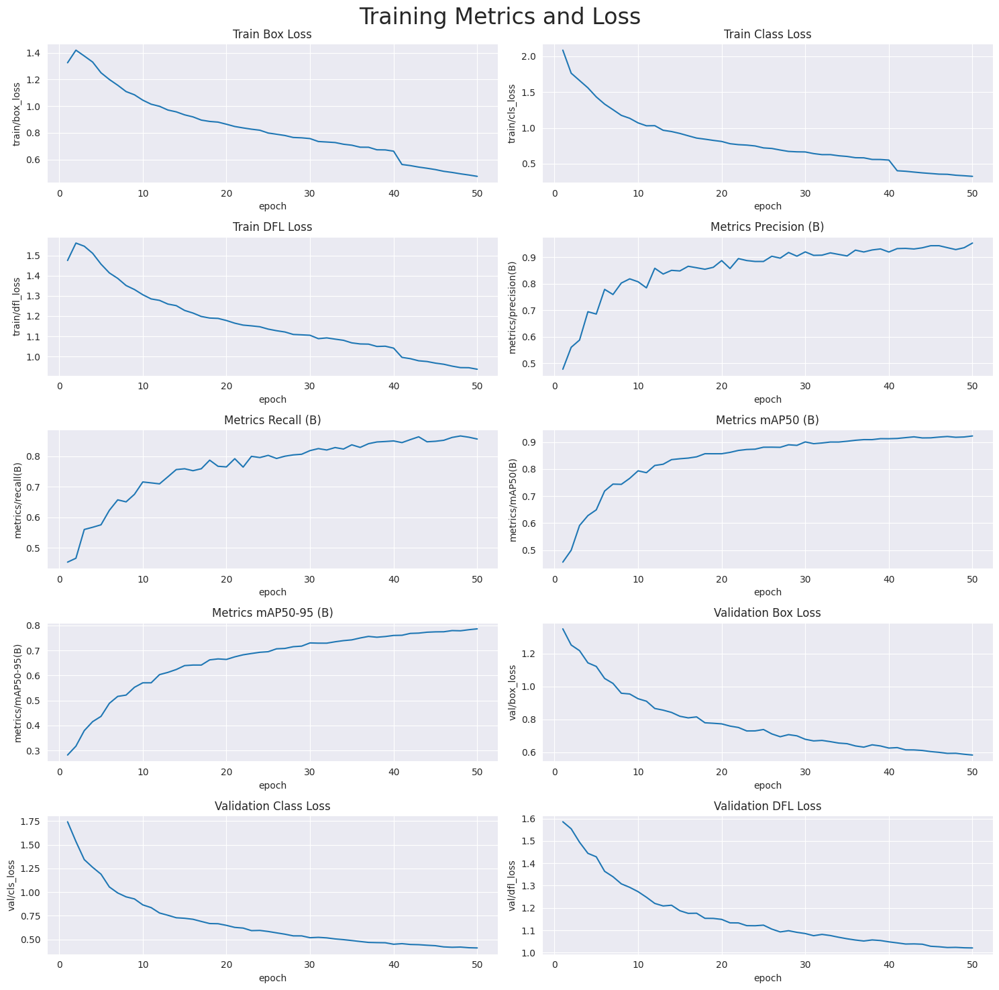

In [7]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv(r'/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [8]:
# Function to perform ship detections
def bag_detect(img_path):

    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


0: 576x640 1 Pliers, 96.4ms
Speed: 3.3ms preprocess, 96.4ms inference, 1.8ms postprocess per image at shape (1, 3, 576, 640)

0: 320x640 3 Wrenchs, 89.1ms
Speed: 2.4ms preprocess, 89.1ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 640)

0: 640x512 1 Pliers, 90.9ms
Speed: 2.0ms preprocess, 90.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 512)

0: 640x640 1 Gun, 1 Pliers, 38.1ms
Speed: 2.7ms preprocess, 38.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x320 1 Pliers, 92.4ms
Speed: 1.7ms preprocess, 92.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 320)

0: 640x480 2 Wrenchs, 76.5ms
Speed: 2.8ms preprocess, 76.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

0: 416x640 2 Knifes, 87.3ms
Speed: 1.8ms preprocess, 87.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 640x640 1 Gun, 2 Plierss, 37.8ms
Speed: 3.5ms preprocess, 37.8ms inference, 1.3ms postprocess per image a

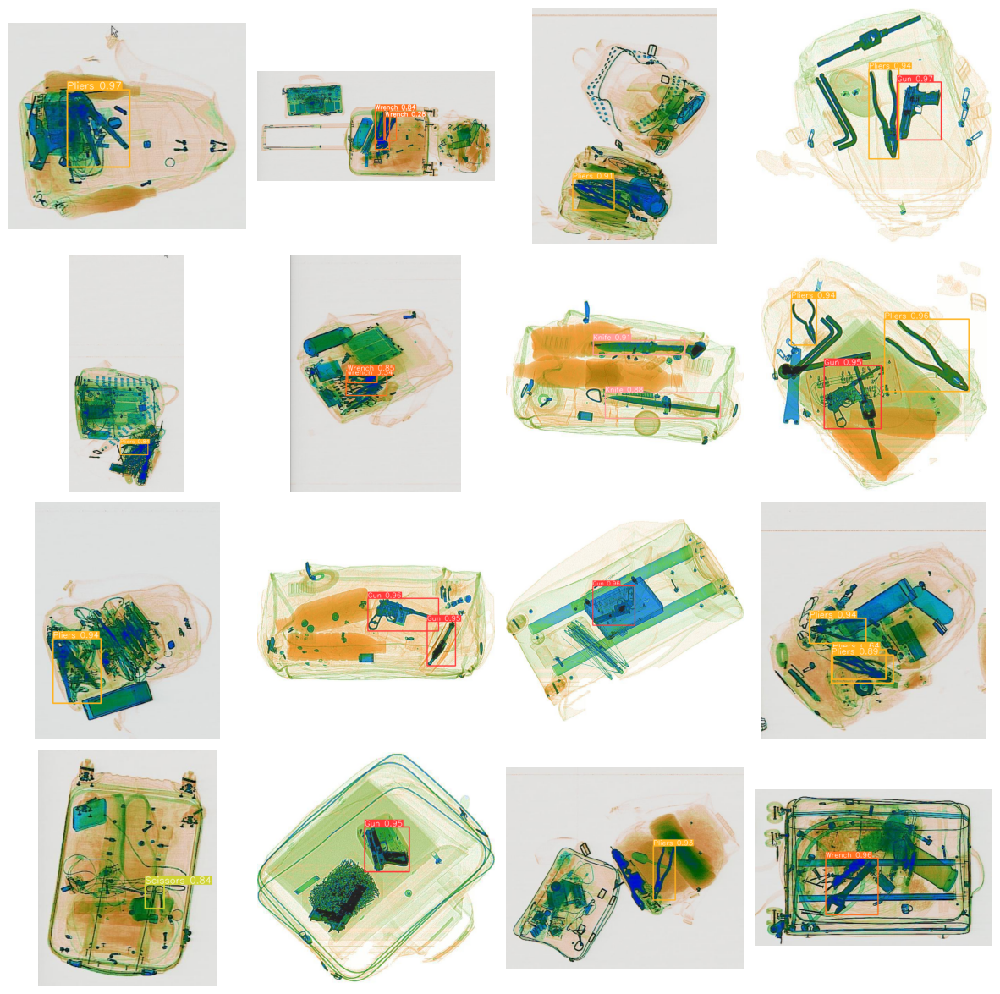

In [9]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = bag_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

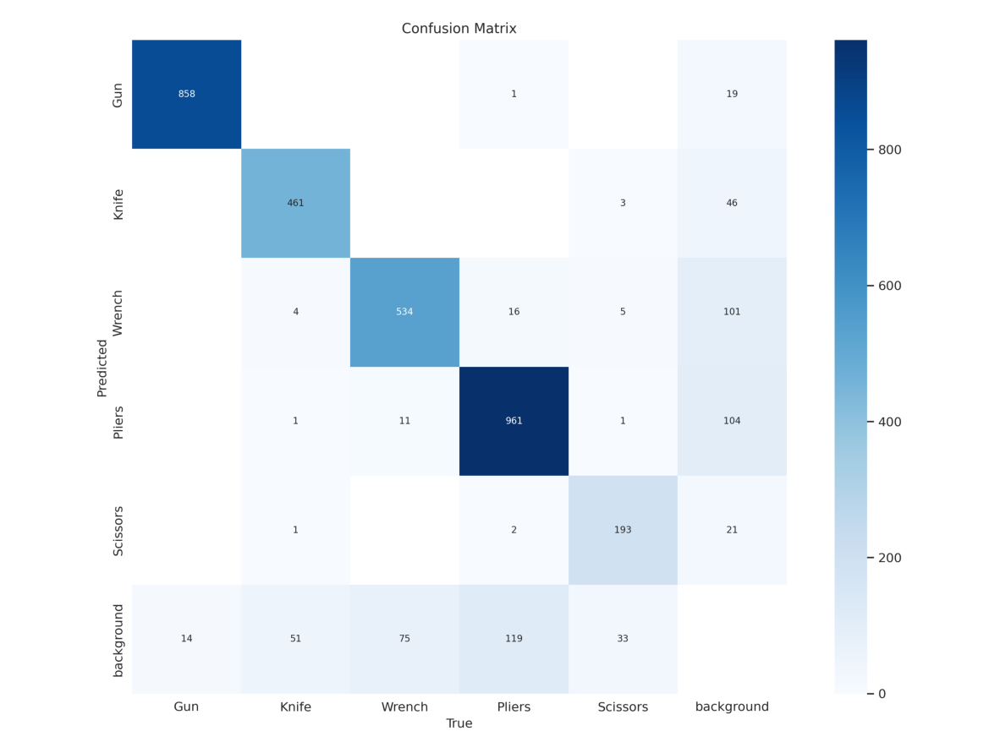

In [10]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off');

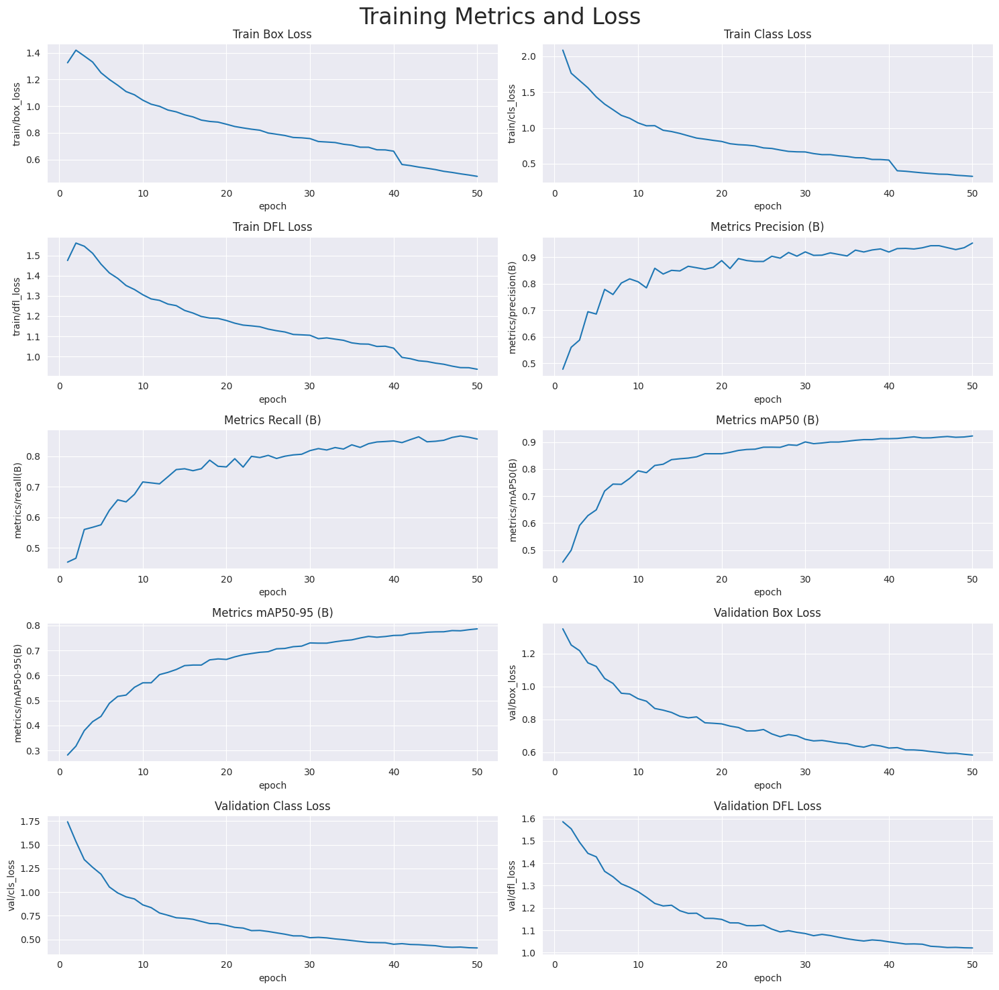

In [11]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv(r'/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [12]:
import pandas as pd

# Load results from CSV
results_path = '/kaggle/working/runs/detect/train/results.csv'
results_df = pd.read_csv(results_path)

# Calculate mean or median of each metric
mean_precision = results_df['   metrics/precision(B)'].mean()
mean_recall = results_df['      metrics/recall(B)'].mean()
mean_mAP_05 = results_df['       metrics/mAP50(B)'].mean()
mean_mAP_095 = results_df['    metrics/mAP50-95(B)'].mean()

# Print the metrics
print(f"Mean Precision: {mean_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f}")
print(f"Mean mAP@0.5: {mean_mAP_05:.4f}")
print(f"Mean mAP@0.5:0.95: {mean_mAP_095:.4f}")

Mean Precision: 0.8590
Mean Recall: 0.7670
Mean mAP@0.5: 0.8391
Mean mAP@0.5:0.95: 0.6602


**YOLOv9**

In [1]:
%pip install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 584.7 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.4/750.4 kB 5.2 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Importing the required libraries
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

In [3]:
import os
import shutil
import random

In [7]:
from ultralytics import YOLO

# Build a YOLOv9c model from scratch
model = YOLO('yolov9c.yaml')

In [4]:
 # Loading a pretrained model
model = YOLO('yolov9c.pt')

# Training the model
model.train(data = '/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml',
            epochs = 50,
            imgsz = 640,
            seed = 42,
            batch = 8,
            workers = 4)

100%|██████████| 49.4M/49.4M [00:00<00:00, 236MB/s]


Ultralytics YOLOv8.1.47 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

100%|██████████| 755k/755k [00:00<00:00, 13.7MB/s]
2024-04-17 03:45:06,880	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-04-17 03:45:07,950	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-04-17 03:45:12.127986: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 03:45:12.128103: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 03:45:12.416774: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 70.0MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train/labels... 5680 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5680/5680 [00:34<00:00, 163.36it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels... 1442 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1442/1442 [00:08<00:00, 162.76it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.93G      1.333      1.971      1.541         23        640: 100%|██████████| 710/710 [04:50<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:27<00:00,  3.25it/s]

                   all       1442       3344      0.423      0.444       0.41      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.91G      1.451      1.801      1.641         32        640: 100%|██████████| 710/710 [04:35<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.86it/s]


                   all       1442       3344      0.561      0.461      0.494      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.81G      1.417       1.73      1.622         39        640: 100%|██████████| 710/710 [04:32<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.84it/s]


                   all       1442       3344      0.609       0.47      0.535      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.83G      1.364      1.599      1.575         43        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.86it/s]


                   all       1442       3344      0.657      0.532      0.597      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       5.8G      1.275      1.477      1.515         37        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.87it/s]

                   all       1442       3344      0.681      0.591      0.654      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       5.8G      1.216      1.368      1.471         39        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.722      0.598       0.68      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.81G      1.168      1.297      1.434         30        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.86it/s]

                   all       1442       3344      0.726      0.631      0.703      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.81G      1.123      1.223      1.403         23        640: 100%|██████████| 710/710 [04:32<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.757      0.651      0.737      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       5.8G      1.095      1.171      1.375         34        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.87it/s]

                   all       1442       3344      0.787      0.698      0.782      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.97G      1.053      1.113      1.343         29        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.827      0.667      0.781      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.97G      1.027      1.067      1.329         36        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.813      0.698      0.792      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.81G      1.012      1.045      1.317         28        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.834      0.721      0.817      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.97G     0.9788     0.9927      1.299         35        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.833      0.727      0.808      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.81G     0.9702     0.9799       1.29         40        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.86it/s]

                   all       1442       3344      0.855      0.723      0.821      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       5.8G     0.9504     0.9477      1.273         23        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.83it/s]

                   all       1442       3344      0.863      0.753      0.841      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.82G     0.9217     0.9111      1.252         35        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344       0.87      0.746      0.843      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       5.8G     0.9007     0.8856      1.238         31        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.867      0.745      0.842      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.82G     0.8916     0.8709      1.225         25        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.85it/s]

                   all       1442       3344      0.872       0.76      0.857      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.81G     0.8812     0.8446      1.219         33        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.869      0.773      0.859      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       5.8G     0.8684     0.8355      1.213         30        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.883      0.771      0.865      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       5.8G     0.8504     0.8063      1.199         38        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.879      0.792      0.874      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.81G     0.8415     0.7866       1.19         26        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.87it/s]

                   all       1442       3344      0.899      0.793      0.877      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       5.8G     0.8268     0.7772       1.18         40        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.875      0.787      0.874      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.83G     0.8219     0.7665      1.177         38        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.888      0.785      0.869      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.81G     0.7995     0.7367      1.163         41        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.904      0.792      0.881      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       5.8G     0.7924     0.7229      1.155         43        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.87it/s]

                   all       1442       3344      0.901      0.806      0.885      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       5.8G     0.7767     0.7046      1.146         33        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344        0.9      0.803      0.882      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.82G     0.7694     0.6928      1.138         29        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.895      0.824      0.893       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       5.8G     0.7561     0.6721      1.127         27        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.918      0.813      0.892      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.81G      0.756     0.6743      1.131         46        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.917      0.811      0.898       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.81G     0.7365     0.6526      1.116         34        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.91it/s]

                   all       1442       3344      0.904      0.827      0.895      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       5.8G     0.7252     0.6337      1.116         28        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.901      0.834      0.895      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.81G     0.7212     0.6349      1.108         27        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344       0.92      0.829      0.901       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.79G     0.7134      0.625      1.105         36        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.939      0.822      0.908      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       5.8G     0.7061     0.6138      1.093         38        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.926      0.824      0.909       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       5.8G     0.6871     0.5936      1.083         33        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.914      0.838      0.907      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       5.8G     0.6871     0.5928      1.082         23        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.929      0.844      0.916      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.81G     0.6696     0.5698      1.072         43        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.87it/s]

                   all       1442       3344      0.928      0.837      0.912      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       5.8G     0.6722      0.568      1.074         22        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.925      0.854      0.916      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.79G      0.658     0.5587       1.06         35        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.923      0.855      0.916      0.767


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.79G     0.5557     0.4178      1.013         24        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.79it/s]

                   all       1442       3344      0.919      0.859      0.917      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       5.8G     0.5474      0.404      1.003         16        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.913      0.871       0.92      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       5.8G     0.5328     0.3884       0.99         24        640: 100%|██████████| 710/710 [04:31<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.937      0.851       0.92      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       5.8G     0.5281     0.3844     0.9894         16        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.935      0.857      0.922      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       5.8G     0.5167     0.3698     0.9828         10        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.88it/s]

                   all       1442       3344      0.921      0.869      0.921      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       5.8G     0.5043     0.3608     0.9759          9        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.934      0.863      0.921      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.81G     0.4941     0.3555     0.9675         20        640: 100%|██████████| 710/710 [04:30<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.939      0.868      0.924      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       5.8G      0.483     0.3422      0.958         11        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.90it/s]

                   all       1442       3344      0.951      0.861      0.924      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       5.8G     0.4759     0.3376     0.9578         19        640: 100%|██████████| 710/710 [04:31<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.943      0.864      0.924      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       5.8G     0.4681       0.33     0.9505         25        640: 100%|██████████| 710/710 [04:30<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:23<00:00,  3.89it/s]

                   all       1442       3344      0.949      0.865      0.925       0.79



50 epochs completed in 4.138 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 51.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.47 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25323103 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:24<00:00,  3.72it/s]


                   all       1442       3344      0.949      0.865      0.925      0.791
                   Gun       1442        872      0.987      0.981      0.994      0.952
                 Knife       1442        518      0.964      0.869      0.932      0.782
                Wrench       1442        620      0.928      0.831      0.905      0.764
                Pliers       1442       1099      0.932      0.826      0.924      0.765
              Scissors       1442        235      0.932      0.821      0.869       0.69
Speed: 0.2ms preprocess, 11.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▃▄▅▅▅▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇██████████████████
metrics/mAP50-95(B),▁▂▂▃▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████
metrics/precision(B),▁▃▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇████▇██████
metrics/recall(B),▁▁▁▂▄▄▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇█████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bb588731090>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

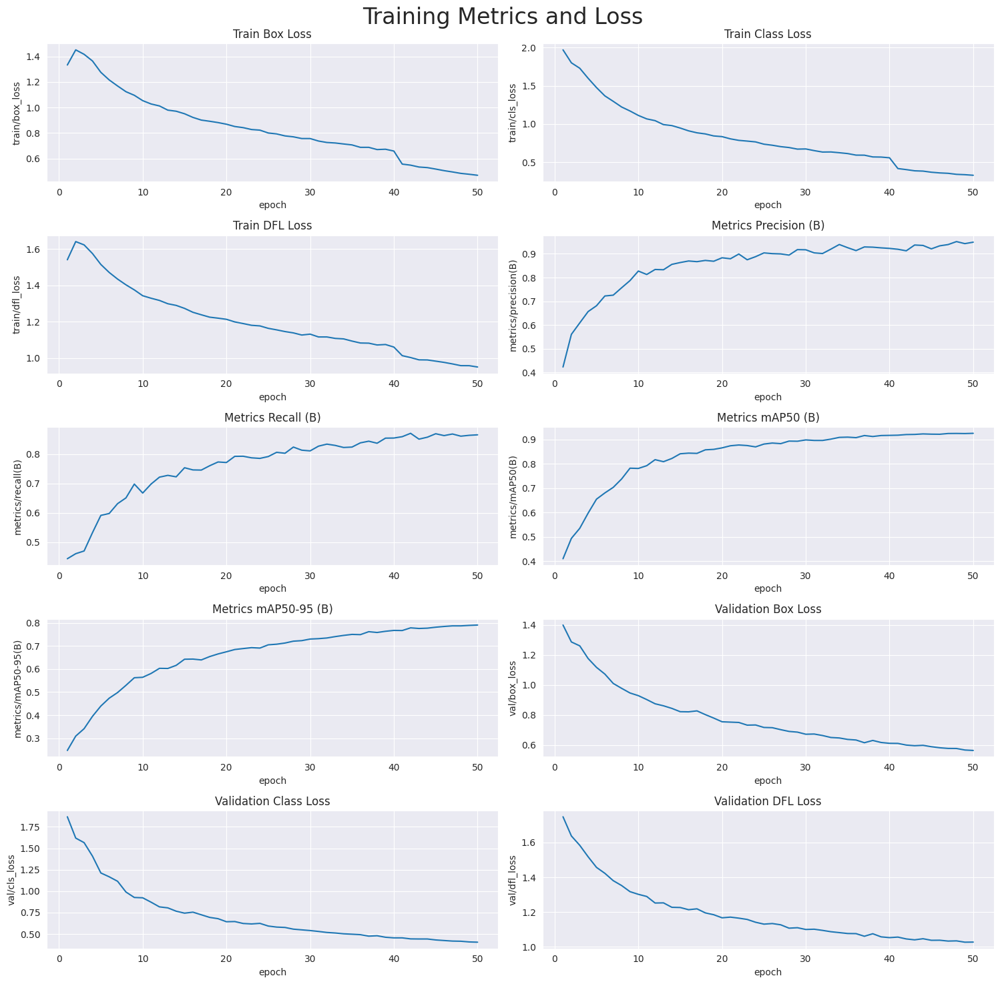

In [5]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv(r'/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [6]:
# Function to perform ship detections
def bag_detect(img_path):

    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


0: 576x640 1 Pliers, 122.4ms
Speed: 3.2ms preprocess, 122.4ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 640)

0: 320x640 1 Wrench, 114.5ms
Speed: 1.6ms preprocess, 114.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)

0: 640x512 1 Pliers, 108.2ms
Speed: 2.8ms preprocess, 108.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)

0: 640x640 1 Gun, 1 Pliers, 50.4ms
Speed: 2.8ms preprocess, 50.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x320 1 Pliers, 109.0ms
Speed: 1.6ms preprocess, 109.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 320)

0: 640x480 1 Wrench, 1 Scissors, 79.6ms
Speed: 2.0ms preprocess, 79.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

0: 416x640 2 Knifes, 105.5ms
Speed: 1.8ms preprocess, 105.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 640x640 1 Gun, 2 Plierss, 47.4ms
Speed: 2.7ms preprocess, 47.4ms inference, 1.3ms pos

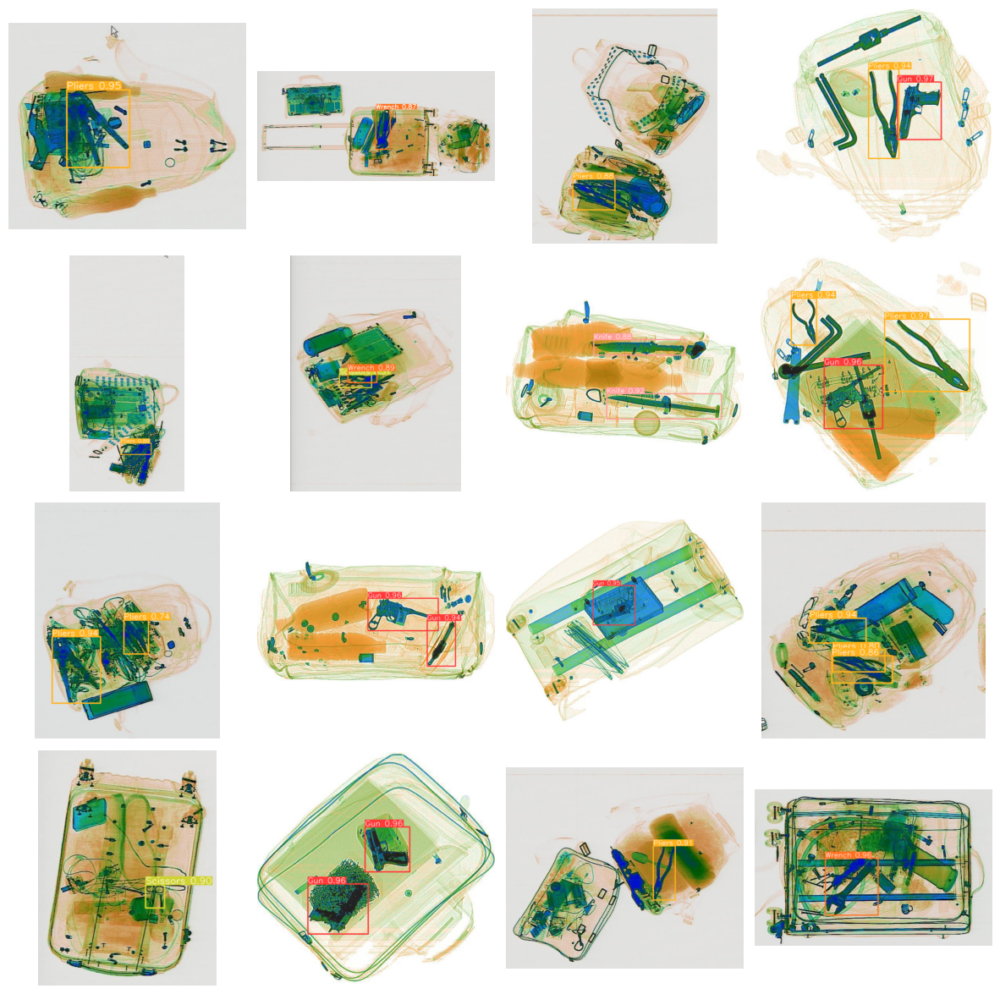

In [7]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = bag_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

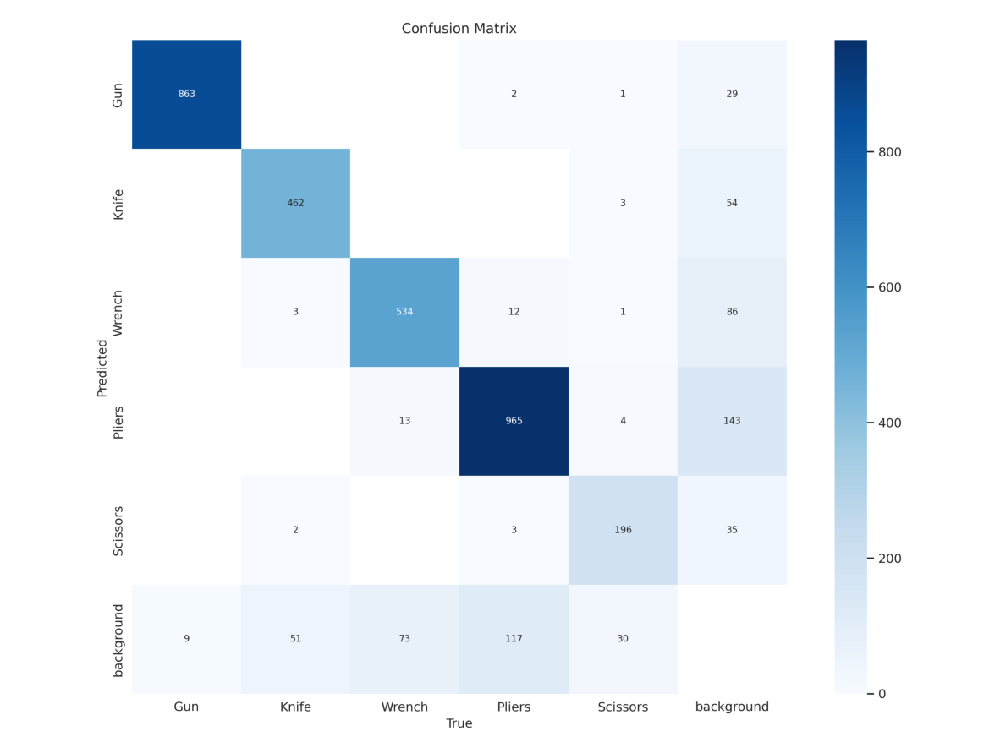

In [10]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off');

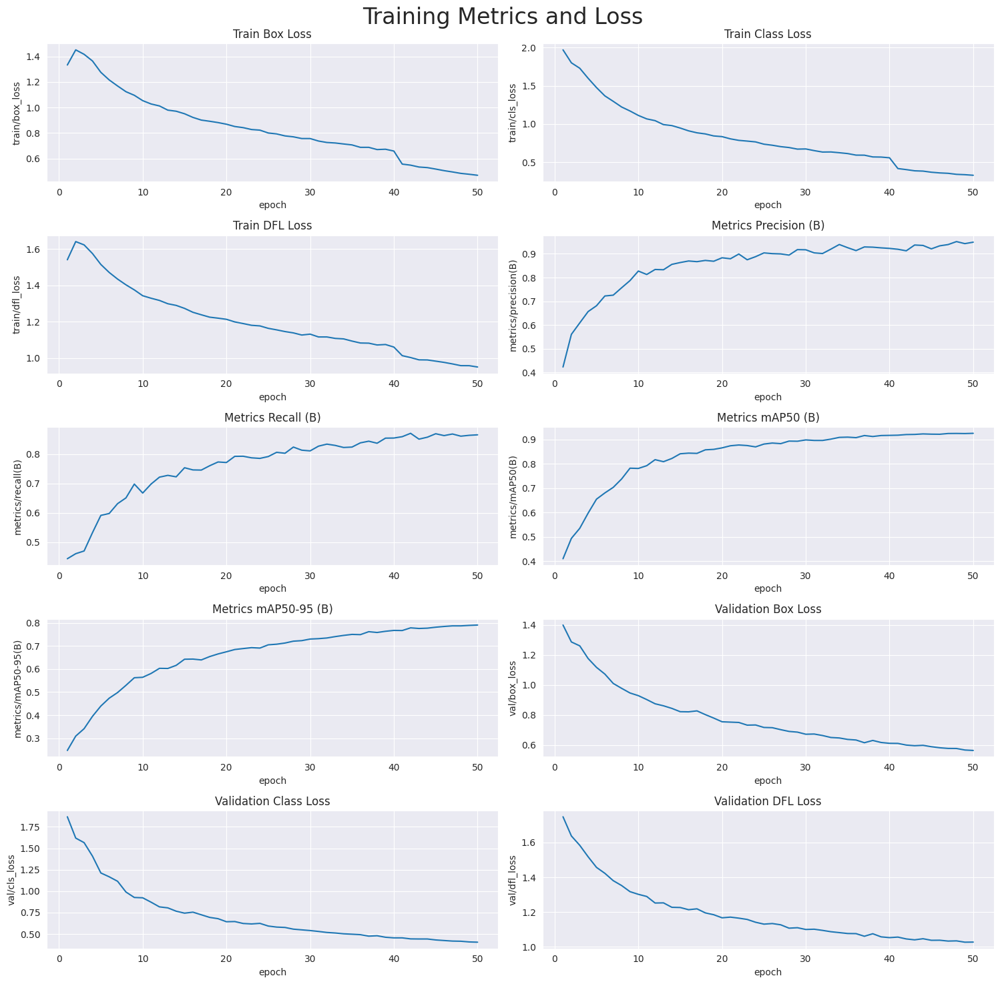

In [8]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv(r'/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [9]:
import pandas as pd

# Load results from CSV
results_path = '/kaggle/working/runs/detect/train/results.csv'
results_df = pd.read_csv(results_path)

# Calculate mean or median of each metric
mean_precision = results_df['   metrics/precision(B)'].mean()
mean_recall = results_df['      metrics/recall(B)'].mean()
mean_mAP_05 = results_df['       metrics/mAP50(B)'].mean()
mean_mAP_095 = results_df['    metrics/mAP50-95(B)'].mean()

# Print the metrics
print(f"Mean Precision: {mean_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f}")
print(f"Mean mAP@0.5: {mean_mAP_05:.4f}")
print(f"Mean mAP@0.5:0.95: {mean_mAP_095:.4f}")

Mean Precision: 0.8566
Mean Recall: 0.7632
Mean mAP@0.5: 0.8367
Mean mAP@0.5:0.95: 0.6609


**YOLOv7**

In [1]:
%pip install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 641.2 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 1.1 MB/s eta 0:00:0000:0100:01m
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Importing the required libraries
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

In [3]:
import os
import shutil
import random

In [5]:
 # Loading a pretrained model
model = YOLO('yolov5n.pt')

# Training the model
model.train(data = '/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml',
            epochs = 50,
            imgsz = 640,
            seed = 42,
            batch = 8,
            workers = 4)

PRO TIP 💡 Replace 'model=yolov5n.pt' with new 'model=yolov5nu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 5.27M/5.27M [00:00<00:00, 64.8MB/s]


Ultralytics YOLOv8.2.1 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov5n.pt, data=/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=

100%|██████████| 755k/755k [00:00<00:00, 14.3MB/s]
2024-04-18 10:38:15,093	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-04-18 10:38:15,904	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-04-18 10:38:18.090312: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-18 10:38:18.090410: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-18 10:38:18.210471: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.24.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 71.9MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train/labels... 5680 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5680/5680 [00:31<00:00, 182.81it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/labels... 1442 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1442/1442 [00:07<00:00, 185.16it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.15G      1.538      2.797      1.502         23        640: 100%|██████████| 710/710 [01:28<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:15<00:00,  5.90it/s]


                   all       1442       3344      0.368      0.375       0.35       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.15G      1.459      2.092      1.459         32        640: 100%|██████████| 710/710 [01:21<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.47it/s]


                   all       1442       3344      0.519      0.447      0.485      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.15G      1.445      1.882      1.452         39        640: 100%|██████████| 710/710 [01:20<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.40it/s]


                   all       1442       3344      0.525      0.476      0.497      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.16G      1.419      1.759      1.443         43        640: 100%|██████████| 710/710 [01:19<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.41it/s]


                   all       1442       3344      0.585      0.502      0.555      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.14G      1.365      1.649      1.409         37        640: 100%|██████████| 710/710 [01:19<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.19it/s]

                   all       1442       3344      0.634      0.563      0.613      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.15G       1.32      1.551      1.374         39        640: 100%|██████████| 710/710 [01:19<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.30it/s]


                   all       1442       3344      0.651      0.563      0.627      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.14G      1.291      1.491      1.358         30        640: 100%|██████████| 710/710 [01:19<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.46it/s]


                   all       1442       3344      0.699      0.566      0.646       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.15G      1.262      1.427      1.338         23        640: 100%|██████████| 710/710 [01:19<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.58it/s]

                   all       1442       3344      0.674      0.598      0.671      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.14G      1.249      1.411      1.324         34        640: 100%|██████████| 710/710 [01:20<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.45it/s]

                   all       1442       3344      0.725      0.593      0.681      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.14G      1.212      1.342      1.308         29        640: 100%|██████████| 710/710 [01:26<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.59it/s]

                   all       1442       3344      0.734      0.635        0.7      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.15G      1.189      1.307      1.292         36        640: 100%|██████████| 710/710 [01:19<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.50it/s]

                   all       1442       3344      0.753      0.631      0.712      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.15G      1.182      1.303      1.289         28        640: 100%|██████████| 710/710 [01:18<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.15it/s]

                   all       1442       3344       0.77      0.615      0.711      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.14G      1.155      1.249      1.273         35        640: 100%|██████████| 710/710 [01:19<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.50it/s]

                   all       1442       3344      0.772      0.639      0.729      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.14G      1.153      1.227       1.27         40        640: 100%|██████████| 710/710 [01:18<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.58it/s]

                   all       1442       3344      0.789      0.641      0.739      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      1.14G      1.129      1.199      1.253         23        640: 100%|██████████| 710/710 [01:19<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.31it/s]

                   all       1442       3344      0.768      0.665      0.747      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      1.15G      1.115      1.175      1.245         35        640: 100%|██████████| 710/710 [01:20<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.59it/s]


                   all       1442       3344      0.777      0.688      0.769      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      1.14G      1.101       1.15      1.233         31        640: 100%|██████████| 710/710 [01:18<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.44it/s]

                   all       1442       3344      0.797      0.657      0.754      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      1.15G      1.095      1.135      1.227         25        640: 100%|██████████| 710/710 [01:19<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.28it/s]

                   all       1442       3344      0.776      0.688      0.766      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      1.14G      1.084      1.113      1.224         33        640: 100%|██████████| 710/710 [01:21<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.10it/s]

                   all       1442       3344      0.803      0.673      0.765       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      1.14G      1.077      1.106      1.218         30        640: 100%|██████████| 710/710 [01:21<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.43it/s]

                   all       1442       3344      0.824      0.679      0.785      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      1.14G      1.061      1.083      1.212         38        640: 100%|██████████| 710/710 [01:18<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.61it/s]

                   all       1442       3344      0.819      0.697      0.788      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      1.14G      1.054      1.071      1.203         26        640: 100%|██████████| 710/710 [01:19<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.48it/s]


                   all       1442       3344      0.843      0.678      0.788      0.581

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      1.14G      1.042      1.057      1.194         40        640: 100%|██████████| 710/710 [01:19<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.51it/s]

                   all       1442       3344      0.814      0.718      0.803      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      1.16G      1.033      1.049       1.19         38        640: 100%|██████████| 710/710 [01:20<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.42it/s]

                   all       1442       3344      0.838      0.715      0.802      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      1.14G       1.02      1.028      1.185         41        640: 100%|██████████| 710/710 [01:19<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.28it/s]

                   all       1442       3344      0.814      0.724      0.806      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      1.14G       1.02      1.018      1.183         43        640: 100%|██████████| 710/710 [01:19<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.32it/s]

                   all       1442       3344      0.842       0.72      0.806      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      1.14G      1.006     0.9929      1.172         33        640: 100%|██████████| 710/710 [01:19<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.47it/s]

                   all       1442       3344       0.87      0.717      0.816      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      1.15G      0.997     0.9776      1.166         29        640: 100%|██████████| 710/710 [01:19<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.55it/s]

                   all       1442       3344      0.849      0.734       0.82      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      1.14G     0.9892     0.9627      1.163         27        640: 100%|██████████| 710/710 [01:19<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.52it/s]

                   all       1442       3344      0.835      0.722      0.814      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      1.14G     0.9826      0.955      1.163         46        640: 100%|██████████| 710/710 [01:19<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.53it/s]

                   all       1442       3344       0.85      0.732      0.825      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      1.15G     0.9608     0.9406      1.145         34        640: 100%|██████████| 710/710 [01:19<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.32it/s]


                   all       1442       3344      0.863      0.722      0.823       0.62

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      1.14G      0.961     0.9342       1.15         28        640: 100%|██████████| 710/710 [01:19<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.36it/s]

                   all       1442       3344      0.847      0.743      0.826      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      1.14G     0.9587     0.9357      1.147         27        640: 100%|██████████| 710/710 [01:19<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.72it/s]

                   all       1442       3344      0.865      0.735      0.834      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      1.15G      0.956     0.9187      1.144         36        640: 100%|██████████| 710/710 [01:19<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.57it/s]

                   all       1442       3344      0.848      0.749      0.835      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      1.14G     0.9454     0.9101      1.137         38        640: 100%|██████████| 710/710 [01:20<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.67it/s]

                   all       1442       3344      0.873      0.738      0.842      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.14G     0.9302     0.8924       1.13         33        640: 100%|██████████| 710/710 [01:19<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.59it/s]

                   all       1442       3344      0.879      0.749      0.841      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.14G     0.9336     0.8892      1.131         23        640: 100%|██████████| 710/710 [01:19<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.31it/s]

                   all       1442       3344      0.879      0.754      0.848      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.14G      0.913     0.8667      1.119         43        640: 100%|██████████| 710/710 [01:19<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.31it/s]

                   all       1442       3344      0.892      0.754       0.85      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.14G     0.9202     0.8736      1.123         22        640: 100%|██████████| 710/710 [01:19<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.59it/s]

                   all       1442       3344      0.887      0.759      0.853      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.14G     0.9038     0.8574       1.11         35        640: 100%|██████████| 710/710 [01:19<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.58it/s]

                   all       1442       3344        0.9      0.754      0.849      0.657


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.28G     0.7937     0.6935      1.058         24        640: 100%|██████████| 710/710 [01:17<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.61it/s]

                   all       1442       3344       0.88      0.766      0.852      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.14G     0.7907     0.6866      1.058         16        640: 100%|██████████| 710/710 [01:16<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.31it/s]

                   all       1442       3344      0.863      0.777      0.857      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.14G     0.7708      0.665      1.043         24        640: 100%|██████████| 710/710 [01:15<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.54it/s]

                   all       1442       3344      0.915      0.752      0.857      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.14G     0.7673     0.6574      1.039         16        640: 100%|██████████| 710/710 [01:15<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.56it/s]


                   all       1442       3344      0.885      0.769      0.862      0.672

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.14G     0.7573     0.6477      1.033         10        640: 100%|██████████| 710/710 [01:15<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.39it/s]

                   all       1442       3344      0.893      0.774      0.861      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.14G     0.7489     0.6376      1.032          9        640: 100%|██████████| 710/710 [01:15<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.35it/s]

                   all       1442       3344      0.899      0.761       0.86      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.14G     0.7437     0.6293      1.027         20        640: 100%|██████████| 710/710 [01:16<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.50it/s]

                   all       1442       3344      0.896      0.779      0.864      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.14G     0.7314     0.6162      1.017         11        640: 100%|██████████| 710/710 [01:16<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.65it/s]

                   all       1442       3344      0.898      0.778      0.865      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.14G     0.7272     0.6122      1.019         19        640: 100%|██████████| 710/710 [01:16<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.24it/s]

                   all       1442       3344      0.914      0.768      0.867      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.14G     0.7226     0.6049      1.016         25        640: 100%|██████████| 710/710 [01:15<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:09<00:00,  9.59it/s]

                   all       1442       3344      0.909      0.776      0.869      0.687



50 epochs completed in 1.254 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.1 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5n summary (fused): 193 layers, 2503919 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 91/91 [00:12<00:00,  7.57it/s]


                   all       1442       3344      0.908      0.776      0.869      0.687
                   Gun       1442        872      0.971      0.967      0.991      0.909
                 Knife       1442        518      0.938       0.83      0.907      0.717
                Wrench       1442        620      0.843      0.694      0.807      0.625
                Pliers       1442       1099      0.906      0.692       0.85      0.634
              Scissors       1442        235      0.881      0.696      0.792      0.549
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▃▃▄▅▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇██████████████
metrics/mAP50-95(B),▁▂▂▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████████
metrics/precision(B),▁▃▃▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████▇██████
metrics/recall(B),▁▂▃▃▄▄▅▅▅▅▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇███████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▂▁▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b0a4b13e3b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

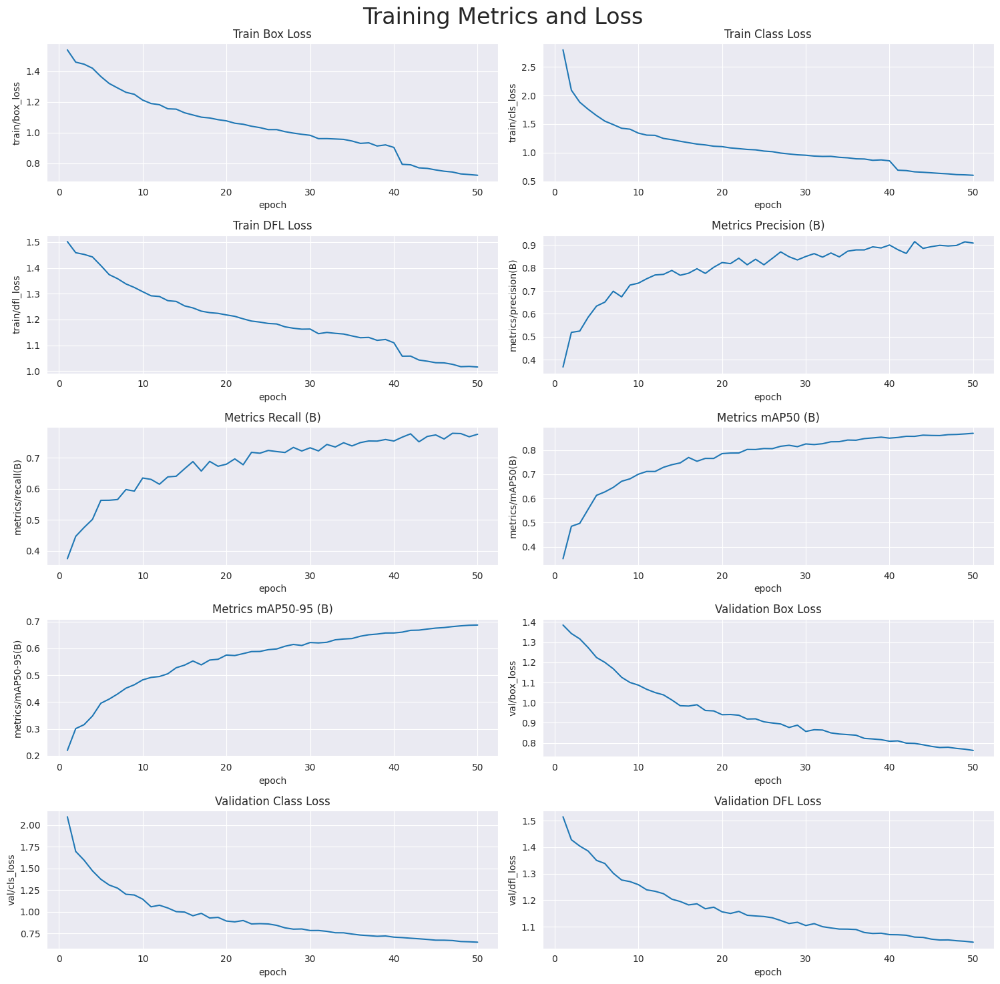

In [6]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv(r'/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [7]:
# Function to perform ship detections
def bag_detect(img_path):

    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


0: 576x640 1 Pliers, 84.4ms
Speed: 3.0ms preprocess, 84.4ms inference, 1.6ms postprocess per image at shape (1, 3, 576, 640)

0: 320x640 3 Wrenchs, 1 Pliers, 78.5ms
Speed: 1.7ms preprocess, 78.5ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)

0: 640x512 2 Plierss, 1 Scissors, 71.3ms
Speed: 2.3ms preprocess, 71.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)

0: 640x640 1 Gun, 1 Pliers, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x320 2 Wrenchs, 1 Pliers, 69.9ms
Speed: 2.2ms preprocess, 69.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 320)

0: 640x480 2 Wrenchs, 29.6ms
Speed: 1.9ms preprocess, 29.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

0: 416x640 2 Knifes, 72.4ms
Speed: 2.6ms preprocess, 72.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 640x640 1 Gun, 2 Plierss, 8.2ms
Speed: 4.5ms preprocess, 8.2ms inference,

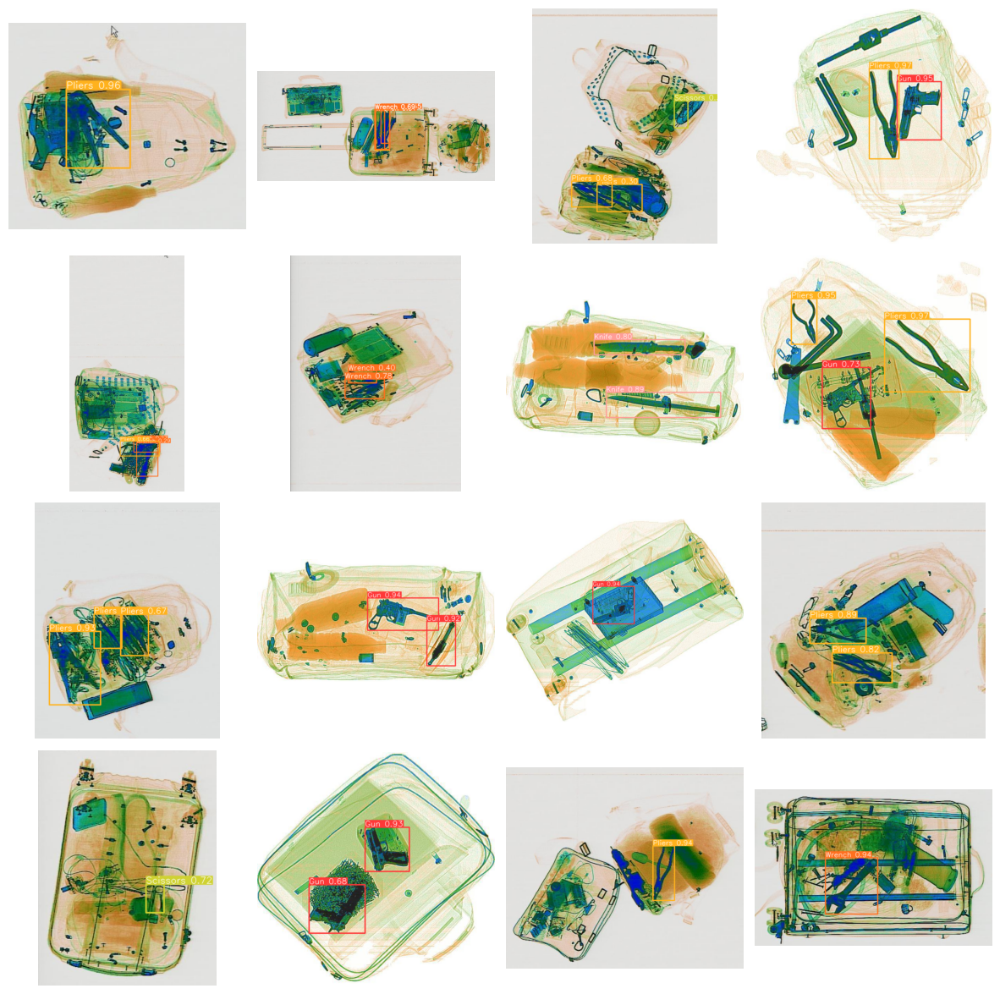

In [8]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/fulltriplethreat/FullDCSMP/chithraMP/valid/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = bag_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

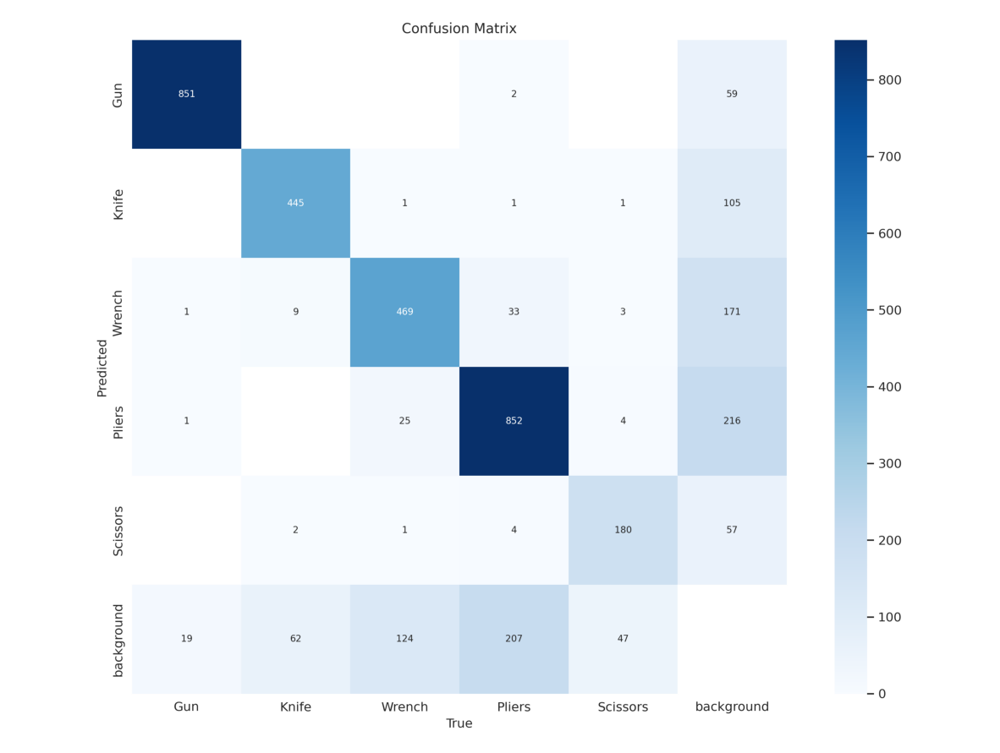

In [9]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off');

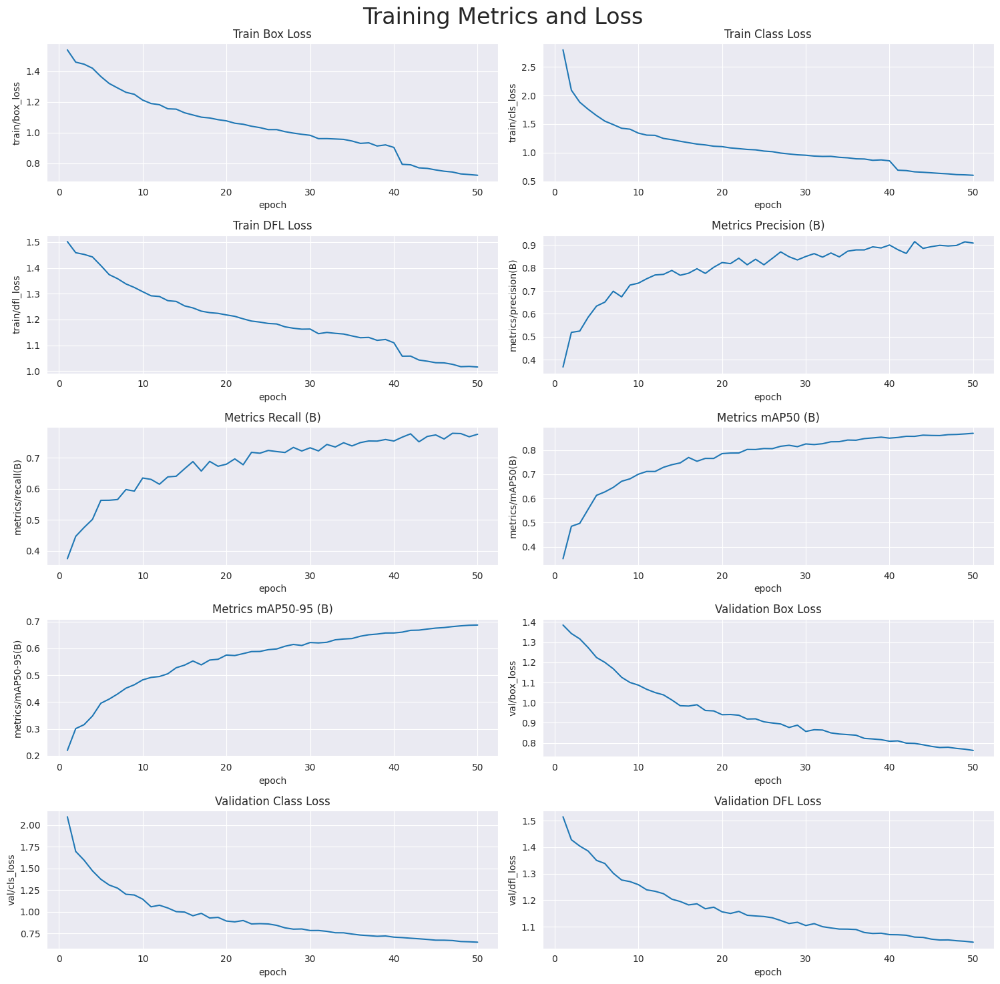

In [10]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv(r'/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [11]:
import pandas as pd

# Load results from CSV
results_path = '/kaggle/working/runs/detect/train/results.csv'
results_df = pd.read_csv(results_path)

# Calculate mean or median of each metric
mean_precision = results_df['   metrics/precision(B)'].mean()
mean_recall = results_df['      metrics/recall(B)'].mean()
mean_mAP_05 = results_df['       metrics/mAP50(B)'].mean()
mean_mAP_095 = results_df['    metrics/mAP50-95(B)'].mean()

# Print the metrics
print(f"Mean Precision: {mean_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f}")
print(f"Mean mAP@0.5: {mean_mAP_05:.4f}")
print(f"Mean mAP@0.5:0.95: {mean_mAP_095:.4f}")

Mean Precision: 0.8001
Mean Recall: 0.6841
Mean mAP@0.5: 0.7677
Mean mAP@0.5:0.95: 0.5663
